# Notebook #1: Your Dishwasher is Very Disappointed In You.

My goal is to make a machine learning model that will:

- detect the cutlery tray of my dishwasher in photos (maybe video too, someday);
- pick out any cutlery or utensils in the various sections of the tray;
- know roughly where it is in the tray;
- and be able to offer advice and criticism about where it should _really_ go.

I plan on doing this by:

- creating and annotating my own dataset (pictures of my dishwasher with varying amounts of cutlery in the tray);
- using PyTorch to do transfer learning on that dataset, using one of the 10e9 object detection models out there;
- and deploying it to an NVidia Jetson Nano.

Let's see how far I can get!

# The dataset

The dataset is, on my laptop, two directories up and one over:

In [ ]:
!ls -l ../../dishwasher_training_data/sorted/train/not_empty | head

total 84544
-rw-r--r--. 1 aardvark aardvark 2300318 Sep  7 20:08 20-09-07 13-08-44 9699.jpg
-rw-r--r--. 1 aardvark aardvark 2331329 Sep  7 20:08 20-09-07 13-08-47 9700.jpg
-rw-r--r--. 1 aardvark aardvark 2139853 Sep  7 20:08 20-09-07 13-08-56 9701.jpg
-rw-r--r--. 1 aardvark aardvark 2132162 Sep  7 20:08 20-09-07 13-08-58 9702.jpg
-rw-r--r--. 1 aardvark aardvark 2349855 Sep  7 20:09 20-09-07 13-09-09 9703.jpg
-rw-r--r--. 1 aardvark aardvark 2504619 Sep  7 20:09 20-09-07 13-09-10 9704.jpg
-rw-r--r--. 1 aardvark aardvark 2287867 Sep  7 20:09 20-09-07 13-09-17 9705.jpg
-rw-r--r--. 1 aardvark aardvark 2403636 Sep  7 20:09 20-09-07 13-09-17 9706.jpg
-rw-r--r--. 1 aardvark aardvark 2165466 Sep  7 20:09 20-09-07 13-09-43 9707.jpg


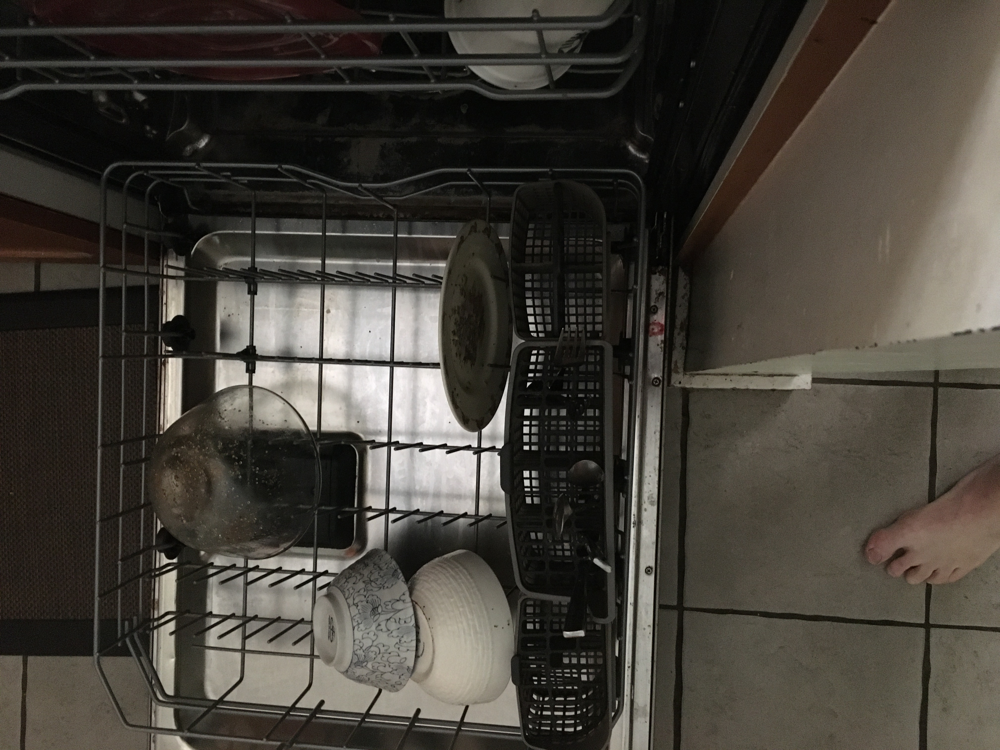

In [ ]:
from pathlib import Path

from IPython.display import Image


dataset_root = Path('../../dishwasher_training_data/sorted/')
training_empty = dataset_root / 'train/empty'
training_not_empty = dataset_root/'train/not_empty'
Image(filename=training_not_empty/'20-09-07 13-08-44 9699.jpg') 

In this picture we see a few things in the bottom rack:
    
- The cutlery tray assembly
- The three sub-trays that make up that assembly
- A couple knives
- Two spoons
- A fork
- Two bowls
- A mixing bowl
- A plate

Also seen are the following things I'm ignoring for now:

- Edge of the top rack
- Cup in the top rack
- Soap dispenser
- Foot
- Floor
- Wall
- Floor mat

# The process

As I currently understand it, the process is:

- Take a bunch of pictures like this (✓, but the more the merrier)
  - Don't forget pictures of the tray when it's empty! ✓
- Annotate them by using one of the 100 different tools to draw bounding boxes around what I want to detect
- Download those annotations & store them by the data
- ~~Train~~Fine-tune the model by pointing it at those pictures and the annotations
- Validate, infer, etc etc

# The tool

[makesense.ai](https://makesense.ai) seems like a good way to go here: it's browser-based, it's Free as in Freedom, and offers output in three formats:

- YOLO zip file
- VOC XML
- plain ol' CSV

# Now what?

One thing I'm having trouble finding is how to get PyTorch to fine tune a model based on your own custom dataset, rather than one of the already-existing datasets out there.  

## Detecto

One library I've found that promises to help with this is Detecto:

- [Medium article](https://medium.com/pytorch/detecto-build-and-train-object-detection-models-with-pytorch-5f31b68a8109)
- [Github repo](https://github.com/alankbi/detecto)
- [Docs](https://github.com/alankbi/detecto)

I appreciate the appeal of "it's only 5 lines of code!", but I also want to know what's going on under the hood.  However: this will help me get started, and with luck in a couple hours I'll have something to show for it.

So!  I've annotated 11 images with the locations of each of the cutlery subtrays using [makesense.ai](https://makesense.ai], and made `copy_annotated_images.py` to copy the matching images from the separate repo that has the raw images.

Let's get started on [the detecto quickstart](https://detecto.readthedocs.io/en/latest/usage/quickstart.html).

In [ ]:
import glob

gallery_imgs = []
annotated_img_root = '/home/aardvark/dev/dishwasher_training_data/annotated/labels_my-project-name_2020-12-26-02-09-53/'

for img in glob.glob(f'{annotated_img_root}/*[jJ][pP][gG]'): #assuming JPG
    gallery_imgs.append(img)

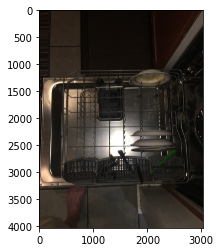

In [ ]:
import matplotlib.pyplot as plt
from detecto.utils import read_image

image = read_image(gallery_imgs[0])
plt.imshow(image)
plt.show()

In [ ]:
from detecto.core import Dataset

dataset = Dataset(annotated_img_root)

In [ ]:
from torchvision import transforms
from detecto.utils import normalize_transform

custom_transforms = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize(800),
    # FIXME: See if RandomVerticalFlip would work here
    transforms.RandomHorizontalFlip(0.5),
    transforms.ColorJitter(saturation=0.2),
    transforms.ToTensor(), # required
    normalize_transform(), #required  
])

dataset = Dataset(annotated_img_root, transform=custom_transforms)

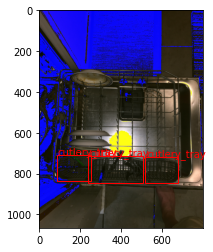

In [ ]:
from detecto.visualize import show_labeled_image

image, targets = dataset[0]
show_labeled_image(image, targets['boxes'], targets['labels'])

Haha, it's working!

In [ ]:
from detecto.core import DataLoader, Model

label_file = "../src/labels.txt"

labels = []

with open(label_file, 'r') as f:
    for line in f:
        labels.append(line[:-1])
    
labels

['cutlery_tray', 'spoon', 'knife', 'fork', 'utensil', 'soap_dispenser']

In [ ]:
!ls ../models/

detecto_model-0.0.1.pth  detecto_model-0.0.2-paperspace.pth


In [ ]:
# model2 = Model.load('../models/detecto_model-0.0.2-paperspace.pth', labels)
model = Model.load('../models/detecto_model-0.0.1.pth', labels[0:6])

RuntimeError: Error(s) in loading state_dict for FasterRCNN:
	size mismatch for roi_heads.box_predictor.cls_score.weight: copying a param with shape torch.Size([6, 1024]) from checkpoint, the shape in current model is torch.Size([7, 1024]).
	size mismatch for roi_heads.box_predictor.cls_score.bias: copying a param with shape torch.Size([6]) from checkpoint, the shape in current model is torch.Size([7]).
	size mismatch for roi_heads.box_predictor.bbox_pred.weight: copying a param with shape torch.Size([24, 1024]) from checkpoint, the shape in current model is torch.Size([28, 1024]).
	size mismatch for roi_heads.box_predictor.bbox_pred.bias: copying a param with shape torch.Size([24]) from checkpoint, the shape in current model is torch.Size([28]).

In [ ]:
loader = DataLoader(dataset, batch_size=2, shuffle=True)
model.fit(loader, verbose=True)

  0%|          | 0/6 [00:00<?, ?it/s]

It looks like you're training your model on a CPU. Consider switching to a GPU; otherwise, this method can take hours upon hours or even days to finish. For more information, see https://detecto.readthedocs.io/en/latest/usage/quickstart.html#technical-requirements
Epoch 1 of 10
Begin iterating over training dataset


 17%|█▋        | 1/6 [00:10<00:50, 10.18s/it]

Okay, about 10 minutes to train over 11 images in batches of 2, and only one crash of Firefox in the meantime.  Let's see what this gets us.

In [ ]:
!find /home/aardvark/dev/dishwasher_training_data/sorted/validation

/home/aardvark/dev/dishwasher_training_data/sorted/validation
/home/aardvark/dev/dishwasher_training_data/sorted/validation/empty
/home/aardvark/dev/dishwasher_training_data/sorted/validation/empty/20-12-20 12-44-18 0352.jpg
/home/aardvark/dev/dishwasher_training_data/sorted/validation/empty/20-12-22 07-23-51 0361.jpg
/home/aardvark/dev/dishwasher_training_data/sorted/validation/empty/IMG_0357.JPG
/home/aardvark/dev/dishwasher_training_data/sorted/validation/not_empty
/home/aardvark/dev/dishwasher_training_data/sorted/validation/not_empty/20-09-07 09-01-49 9698.jpg
/home/aardvark/dev/dishwasher_training_data/sorted/validation/not_empty/20-09-08 17-44-09 9745.jpg
/home/aardvark/dev/dishwasher_training_data/sorted/validation/not_empty/20-09-09 18-34-11 9761.jpg
/home/aardvark/dev/dishwasher_training_data/sorted/validation/not_empty/20-09-11 18-25-06 9773.jpg
/home/aardvark/dev/dishwasher_training_data/sorted/validation/not_empty/20-09-11 18-25-13 9774.jpg


In [ ]:
val_img_root = '/home/aardvark/dev/dishwasher_training_data/sorted/validation' 

val_imgs = []
for img in glob.glob(f'{val_img_root}/**/*[jJ][pP][gG]'):
    val_imgs.append(read_image(img))
    
len(val_imgs)

8

In [ ]:
from detecto.visualize import show_labeled_image

image = val_imgs[1]

In [ ]:
type(image)

numpy.ndarray

In [ ]:
image.shape

(3024, 4032, 3)

In [ ]:
model.predict([image])

[(['cutlery_tray',
   'cutlery_tray',
   'cutlery_tray',
   'cutlery_tray',
   'cutlery_tray',
   'cutlery_tray',
   'cutlery_tray',
   'cutlery_tray',
   'cutlery_tray',
   'cutlery_tray',
   'cutlery_tray',
   'cutlery_tray',
   'cutlery_tray',
   'cutlery_tray',
   'cutlery_tray',
   'cutlery_tray',
   'cutlery_tray',
   'cutlery_tray',
   'cutlery_tray',
   'cutlery_tray',
   'cutlery_tray',
   'cutlery_tray',
   'cutlery_tray',
   'cutlery_tray',
   'cutlery_tray',
   'cutlery_tray',
   'cutlery_tray',
   'cutlery_tray',
   'cutlery_tray',
   'cutlery_tray',
   'cutlery_tray',
   'cutlery_tray',
   'cutlery_tray',
   'cutlery_tray',
   'cutlery_tray',
   'cutlery_tray',
   'cutlery_tray',
   'cutlery_tray',
   'cutlery_tray',
   'cutlery_tray',
   'cutlery_tray',
   'cutlery_tray',
   'cutlery_tray',
   'cutlery_tray',
   'cutlery_tray',
   'cutlery_tray',
   'cutlery_tray',
   'cutlery_tray',
   'cutlery_tray',
   'cutlery_tray',
   'cutlery_tray',
   'cutlery_tray',
   'cutlery_

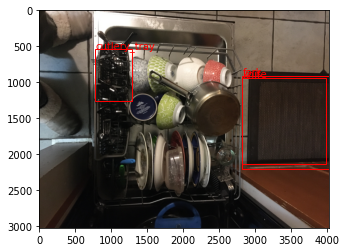

cutlery_tray
tensor(0.4997)


In [ ]:
labels, boxes, scores = model.predict_top(image)
show_labeled_image(image, boxes, labels)
print(labels[0])
print(scores[0])

In [ ]:
model2.predict([image])

NameError: name 'model2' is not defined

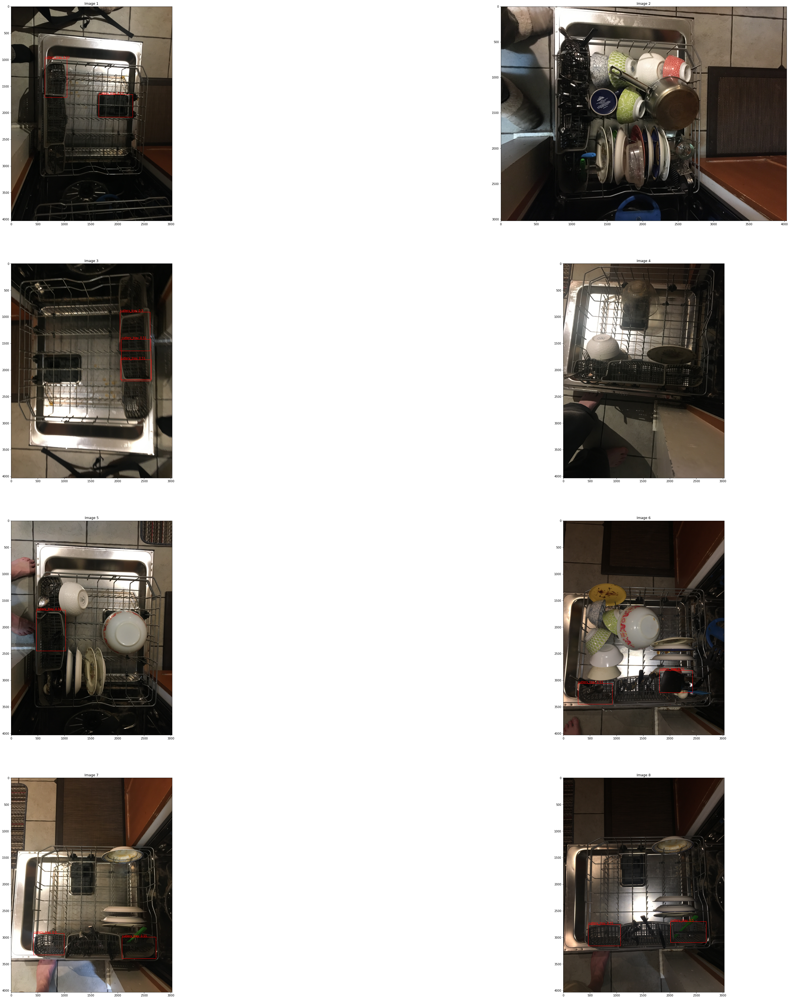

In [ ]:
from detecto.visualize import plot_prediction_grid

plot_prediction_grid(model, val_imgs, dim=(4, 2), figsize=(64, 64), score_filter=0.5)

# Awesome!

This is a great start.  There are things left to do here, but in a couple hours I've been able to get a model trained, use it to make predictions, and display those predictions.

It's also pointed out some shortcomings:

- Still under serious memory constraint when training.  
- Approx 1 minute per image when training on CPU.
- It is *not* predicting terribly well.  There are more than a few places where I expected to see bounding boxes, and instead there was nothing.
- If you lower the threshold enough, there are places where it figures it sees a knife.  I labelled no knives at all -- what's going on here?  Do I need to explicitly turn on penalties for making predictions for something not in the image?


# TODO

- Training pictures with one or two cutlery subtrays removed
- Much more annotated data!
- More training data showing the soap dispenser
  - May need to annotate the soap dispenser
- Turn this notebook into a script
  - Automate more of the annotation/data prep part
- Try serving this model with torchserve

# Future reference

https://pytorch.org/tutorials/intermediate/torchvision_tutorial.html

# And before we go....

Let's save the model for future experimentation.

In [ ]:
model.save('../models/detecto_model-0.0.1.pth')

In [ ]:
!ls -l ../models/
!du -h ../models/*

total 161928
-rw-r--r--. 1 aardvark aardvark 165810830 Dec 26 16:48 detecto_model-0.0.1.pth
159M	../models/detecto_model-0.0.1.pth
